## Analyzing Fields

`boussinesq.F90` outputs numerous `.ncf` files that contain the complete 3D physical space fields of their respective variables. The fields output by `boussinesq.F90` are `U`, `V`, `W`, `ZX`, `ZY`, `ZZ`, and `TH`, which correspond to the components of velocity, the components of vorticity, and the (potential) temperature. This fields can be examined and plotted in their own right, and can also be used to calculate other fields of interest after the simulation. The processing, plotting, and calculation of fields is handled by `fields.py` from the post-processing suite. To begin, we import the module, as well as some standard libraries.

In [1]:
import sys
import cmocean as cmo
from IPython.display import Image, display
sys.path.append("../src")
from fields import *

The main function for calculating new fields from pre-existing fields is `calculate_field`. As well, there are three plotting functions: `plot_field`, `animate_field_space`, and `animate_field_time`. We will examine each of these functions in turn.

### calculate_field

We begin by calculating new fields from fields output by `boussinesq.F90`, since the plotting functions we will see later work identically regardless of whether the field was calculated during or after the simulation. To calculate new fields, we use `calculate_field`. Run the following cell to get more information about this function.

In [2]:
calculate_field?

The field to be calculated is determined by the variable name that gets passed to `calculate_field`. The fields that can be calculated are included in the following list. Note that either of the provided names can be used, but the second name is used invariably in the `.ncf` file(s) generated by `calculate_field`.
- `"temperature gradient"` / `"GRADTH"`
- `"temperature Laplacian"` / `"LTH"`
- `"speed"` / `"SP"`
- `"kinetic energy"` / `"KE"`
- `"velocity divergence"` / `"DIVU"`
- `"velocity Laplacian`" / `"LU"`
- `"vorticity divergence`" / `"DIVZ"`
- `"vorticity Laplacian`" / `"LZ"`
- `"strain components"` / `"SIJ"`
- `"normal strain"` / `"SN"`
- `"shear strain"` / `"SS"`
- `"strain"` / `"S"`
- `"spin"` / `"R"`
- `"Okubo-Weiss"` / `"OW"`

The time(s) at which the new field is calculated is determined by the file number of the original fields. The field outputs from `boussinesq.F90` are of the form `var_name.file_num.ncf`, where `file_num` is related to the time at which the field was calculated. `calculate_field` can either take a single file number as a string, in which case it will calculate the specified field at that one time, or it can take an array-like object containing multiple file number strings, in which case it will calculate the specified field at each specified time.

#### Example: kinetic energy field

The kinetic energy field is not calculated by `boussinesq.F90`. However, the components of the velocity are; this makes calculating the kinetic energy trivial. For example, suppose we want to calculate the kinetic energy using the velocity fields at output 04. The code to do so is:

In [3]:
calculate_field(
    field = "kinetic energy",
    data_path = "./data",
    file_nums = "04",
    out_path = "./data"
)

The kinetic energy field at output 04 is now saved as `"./data/KE.04.ncf"`. If we want to calculate the kinetic energy at outputs 01, 04, and 11, then all we have to do is replace `"04"` with `["01", "04", "11"]`, giving us

In [4]:
calculate_field(
    field = "KE",
    data_path = "./data",
    file_nums = ["01", "04", "11"],
    out_path = "./data"
)

Note that in this example, `"KE"` was used for the field name instead of `"kinetic energy"`.

#### Example: gradient of temperature

To calculate the gradient of the temperature at output 04, we use the following code:

In [5]:
calculate_field(
    field = "temperature gradient",
    data_path = "./data",
    file_nums = "04",
    out_path = "./data"
)

This example differs from the last in that while kinetic energy is a scalar value, the gradient of the temperature is a vector value. The gradient is therefore broken up into its components, which are saved separately as `./data/GRADTHX.ncf`, `./data/GRADTHY.ncf`, and `./data/GRADTHZ.ncf`.

### plot_field

`plot_field` is the primary function used for visualizing the fields in `.ncf` files. `plot_field` must provide a representative visualization of a three-dimensional field using two dimensions. To do so, slices of data along the xy, xz, and yz-planes can be specified, and then displayed side-by-side. Furthermore, the evolution of the field through time can be represented by stacking these collections of slices. Run the following cell to get more information about this function.

In [6]:
plot_field?

Unlike `calculate_field`, fields can only be passed to `plot_field` using the capital letter prefix of their `.ncf` file. This means that, when combining the outputs of `boussinesq.F90` and the fields available through `calculate_fields`, the potential fields that can be passed to `plot_field` are:
- `"U"`
- `"V"`
- `"W"`
- `"ZX"`
- `"ZY"`
- `"ZZ"`
- `"TH"`
- `"GRADTHX"`
- `"GRADTHY"`
- `"GRADTHZ"`
- `"LTH"`
- `"SP"`
- `"KE"`
- `"DIVU"`
- `"LU"`
- `"LV"`
- `"LW"`
- `"DIVZ"`
- `"LZX"`
- `"LZY"`
- `"LZZ"`
- `"S11"`
- `"S22"`
- `"S33"`
- `"S12"`
- `"S23"`
- `"S31"`
- `"SN"`
- `"SS"`
- `"S"`
- `"R"`
- `"OW"`

Note that `plot_field` will not automatically calculate fields handled by `calculate_field` if the fields do not already exist.

#### Example: plotting temperature

Suppose we want to plot xy, xz, and yz slices, each taken at index 127 of their respective planes (a completely arbitrary choice), of the temperature at output 04. We can do so using the code:

In [7]:
plot_field(
    field = "TH",
    data_path = "./data",
    file_nums = "04",
    out_path = "./figs",
    xy_idx = 127,
    xz_idx = 127,
    yz_idx = 127,
    cmap = cmo.cm.thermal
)

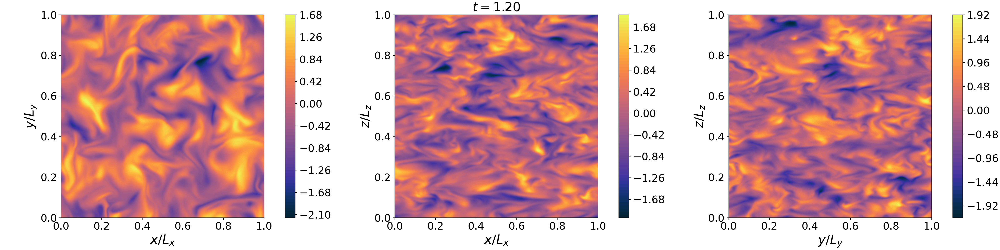

In [8]:
TH_plot = Image(filename="./figs/TH.04.127_127_127.png", width=1200, height=400)
display(TH_plot)

There are a few important things to note about this plot. First, the simulation time corresponding to output 04, t = 1.20, is displayed above the plot. Second, there is a separate colour bar for each subplot. Finally, the axes of each slice are always scaled by the length of the axes in the simulation, so that the domain of each plot is $[0,1] \times [0,1]$.

As well, notice that unlike the plotting function in `time_series.py` and `spectra.py`, the name of the plot is not specified. Instead, only the output path is specified, and the plot name is automatically generated to match the convention set by the `.ncf` files.

Suppose we are only interested in the xy slice for output 04, and do not want to display the xz or yz slices. To hide a slice, set its index to `None`. For example,

In [9]:
plot_field(
    field = "TH",
    data_path = "./data",
    file_nums = "04",
    out_path = "./figs",
    xy_idx = 127,
    xz_idx = None,
    yz_idx = None,
    cmap = cmo.cm.thermal
)

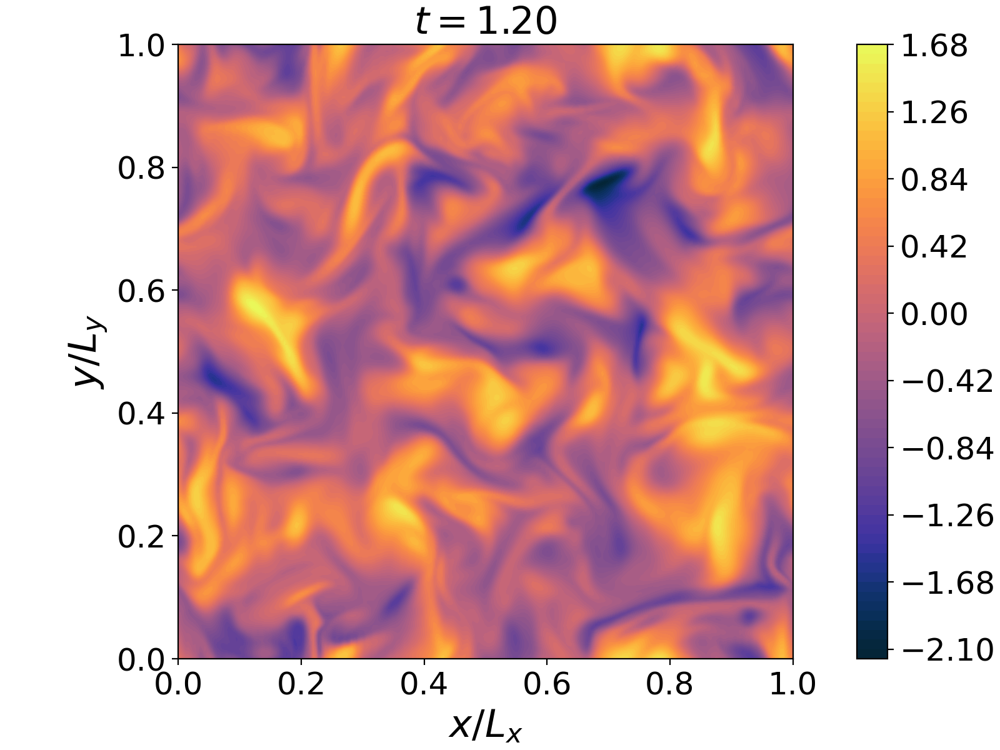

In [10]:
TH_plot = Image(filename="./figs/TH.04.127_None_None.png", width=400, height=400)
display(TH_plot)

The time evolution of the field can be visualized by stacking collections of slices. To visualize the xy, xz, and yz planes at outputs 01, 04, and 11, we simply replace `file_nums = "04"` in the second last example with `file_nums = ["01", "04", "11"]`. This gives us:

In [11]:
plot_field(
    field = "TH",
    data_path = "./data",
    file_nums = ["01", "04", "11"],
    out_path = "./figs",
    xy_idx = 127,
    xz_idx = 127,
    yz_idx = 127,
    cmap = cmo.cm.thermal
)

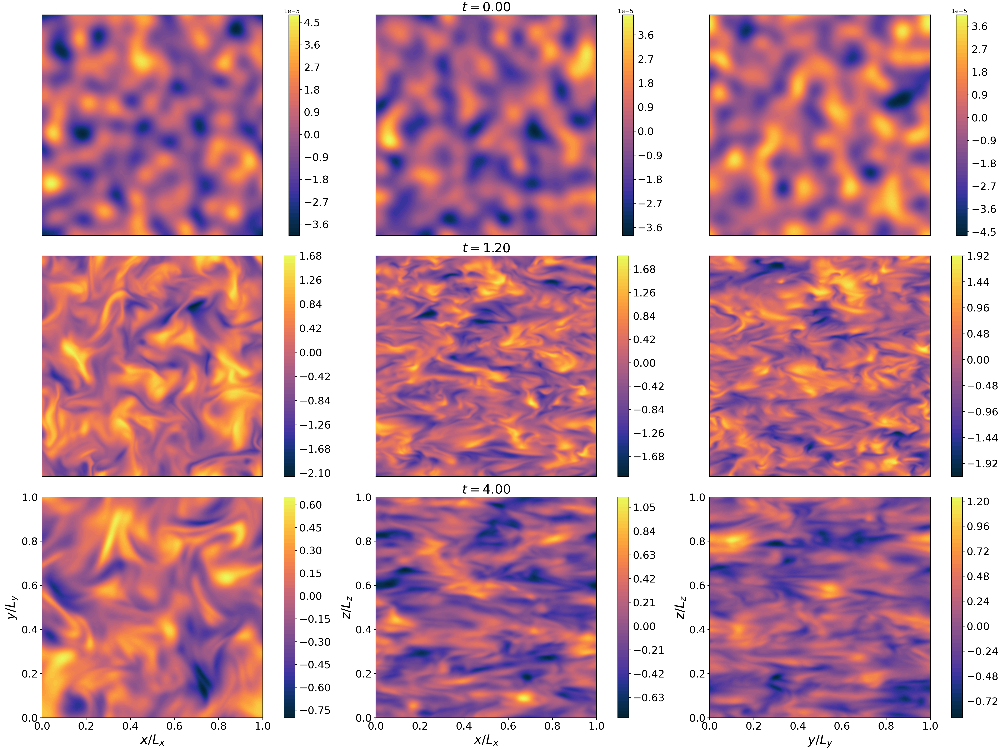

In [12]:
TH_plot = Image(filename="./figs/TH.010411.127_127_127.png", width=1200, height=1200)
display(TH_plot)

#### Example: plotting strain

Field computed by `calculated_field` can be plotted by `plot_field` in an identical manner to fields generated by `boussinesq.F90`. For example, consider calculating the magnitude of the strian rate tensor at outputs 01, 04, and 11:

In [13]:
calculate_field(
    field = "S",
    data_path = "./data",
    file_nums = ["01", "04", "11"],
    out_path = "./data"
)

The results of this calculation can be plotted as follows:

In [14]:
plot_field(
    field = "S",
    data_path = "./data",
    file_nums = ["01", "04", "11"],
    out_path = "./figs",
    xy_idx = 127,
    xz_idx = 127,
    yz_idx = 127,
    cmap = cmo.cm.dense.reversed()
)

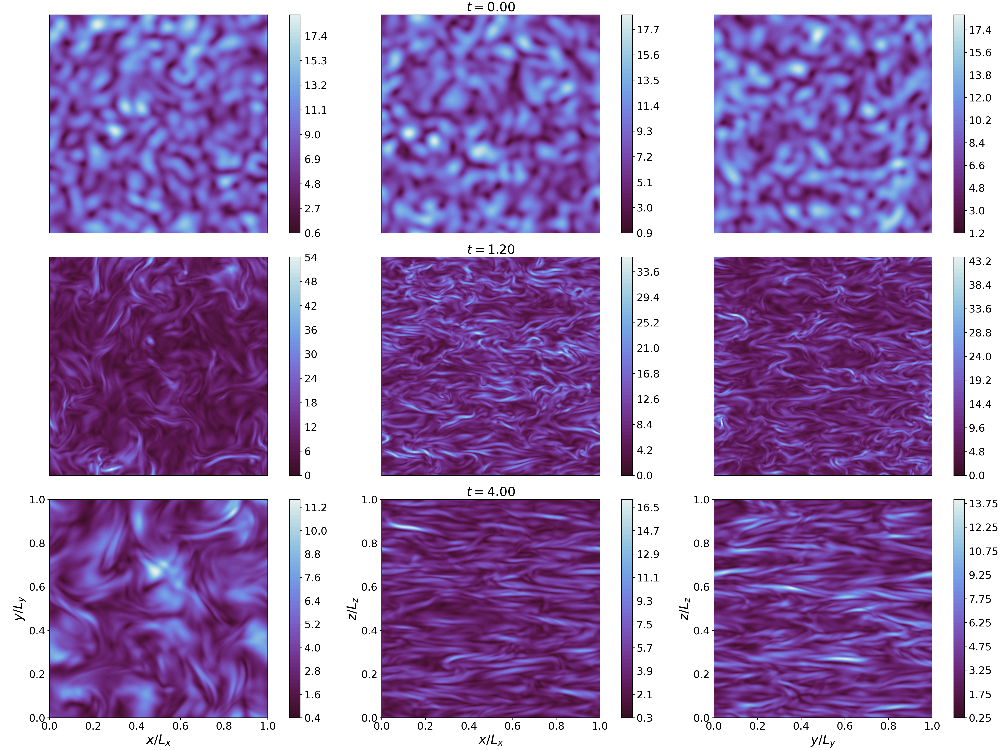

In [15]:
S_plot = Image(filename="./figs/S.010411.127_127_127.png", width=1200, height=1200)
display(S_plot)

### animate_field_space

`animate_field_space` provides an alternative approach to visualizing 3D data. Rather than taking slices along each of the axes and displaying them side by side, `animate_field_space` picks one pair of axes and then moves along the axis orthogonal to the pair, forming an animation out of successive slices along the pair of axes. Run the following cell to get more information about this function.

In [16]:
animate_field_space?

The potential fields that can be passed to `animate_field_space` are identical to those that can be passed to `plot_field`. All six combinations (x,y), (y,x), (x,z), (z,x), (y,z), and (z,y) can be passed as the axes of choice for the animation. Note that no time evolution is displayed; the animation is strictly spatial.

#### Example: animating vorticity

We can construct an animation of the z-component of vorticity along the xy-plane at output 04 as follows:

In [3]:
animate_field_space(
    field = "ZZ",
    data_path = "./data",
    file_num = "04",
    out_path = "./figs",
    axes = ("x","y"),
    thinning = 2,
    cmap = "seismic",
    centre_cmap = True,
    dpi = 100,
    fps = 15
)

![SegmentLocal](figs/ZZ.04.xy.gif "segment")

### animate_field_time

`animate_field_time` is essentially an animated version of `plot_field`. As such, the core arguments are identical. However, rather than stacking the rows of slices, they are displayed one after the other in an animation. Such an animation is only an effective way of visualizing the data if there are a high number of outputs. Otherwise, the fields are too far apart in time to change from one to the next somewhat smoothly. Run the following cell to get more information about this function.

In [30]:
animate_field_time?

The potential fields that can be passed to `animate_field_time` are identical to those that can be passed to `plot_field`.